In [11]:
!pip install tensorflow==2.15.0, keras==2.15.0, keras-cv==0.6.0, tensorflow_datasets==4.9.6, keras_core==0.1.7

  Using cached tensorflow-2.15.0-cp310-cp310-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (4.4 kB)
  Using cached keras-2.15.0-py3-none-any.whl.metadata (2.4 kB)
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 475.2/475.2 MB 4.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 75.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 756.3/756.3 kB 49.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.1/5.1 MB 85.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 62.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.5/5.5 MB 97.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 442.0/442.0 kB 36.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 77.9/77.9 kB 7.8 MB/s eta 0:00:00
  Attempting uninstall: wrapt
    Found existing installation: wrapt 1.16.0
    Uninstalling wrapt-1.16.0:
      Successfully uninstalled wrapt-1.16.0
  Attempting uninstall: ml-dtypes
    Found exis

In [2]:
import time
import keras_cv
from tensorflow import keras
import matplotlib.pyplot as plt

Using TensorFlow backend


In [2]:
model = keras_cv.models.StableDiffusion(
    img_width=512,
    img_height=512,
    jit_compile=False
)

By using this model checkpoint, you acknowledge that its usage is subject to the terms of the CreativeML Open RAIL-M license at https://raw.githubusercontent.com/CompVis/stable-diffusion/main/LICENSE


In [3]:
prompt = "girl lokking to side, jeweled crown, close-up, cinematic-lighting, \
fantasy art, disney pixar style, ethereal glow, vibrant colors, forest"

In [4]:
images = model.text_to_image(prompt, batch_size=3)

198180272/198180272 [==============================] - 1s 0us/step


In [6]:
def plot_images(images):
  plt.figure(figsize=(20, 20))
  for i in range(len(images)):
    ax = plt.subplot(1, len(images), i+1)
    plt.imshow(images[i])
    plt.axis("off")

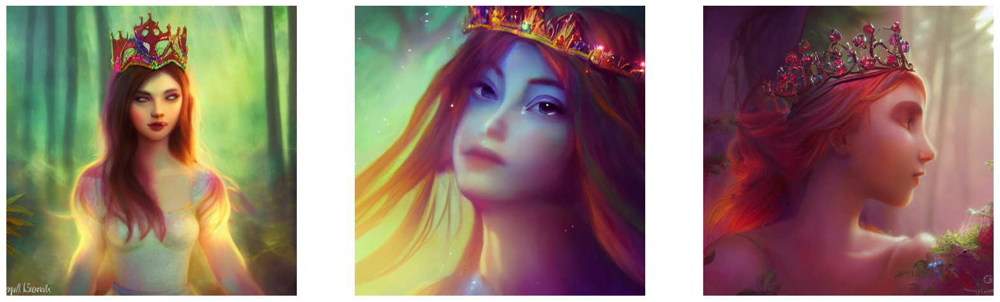

In [6]:
plot_images(images)

50/50 [==============================] - 120s 2s/step
Default model: 122.39 seconds


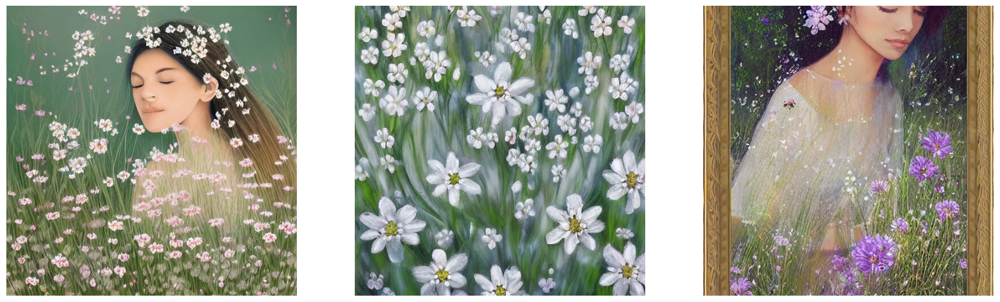

In [8]:
start = time.time()

images = model.text_to_image(
    "Serene flowers bloom in a peaceful meadow, capturing the essence of "\
    "tranquility, elegance, and grace in their delicate petals The intricate "\
    "details of each blossom create a realistic and mesmerizing portrait that "\
    "transports you to a world of beauty and calmness",
    batch_size = 3
)
end = time.time()
plot_images(images)
print(f"Default model: {(end - start):.2f} seconds")

In [9]:
keras.mixed_precision.set_global_policy("mixed_float16")

In [10]:
model = keras_cv.models.StableDiffusion(jit_compile=False)

print("Compute dtype:", model.diffusion_model.compute_dtype)
print("Variable dtype:", model.diffusion_model.variable_dtype)

By using this model checkpoint, you acknowledge that its usage is subject to the terms of the CreativeML Open RAIL-M license at https://raw.githubusercontent.com/CompVis/stable-diffusion/main/LICENSE
Compute dtype: float16
Variable dtype: float32


50/50 [==============================] - 80s 1s/step


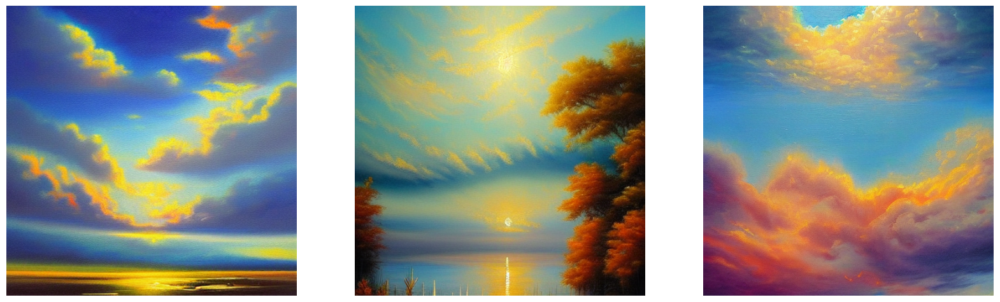

In [11]:
#Warm up model to run graph tracing before benchmarking.
images = model.text_to_image(
    "Tranquil Sky Heaven, Peaceful Expression, Oil Painting, Detailed, "\
    "Calming, Harmonious, intricate details",
    batch_size=3
)

plot_images(images)

50/50 [==============================] - 62s 1s/step
Mixed precision model: 62.86 seconds


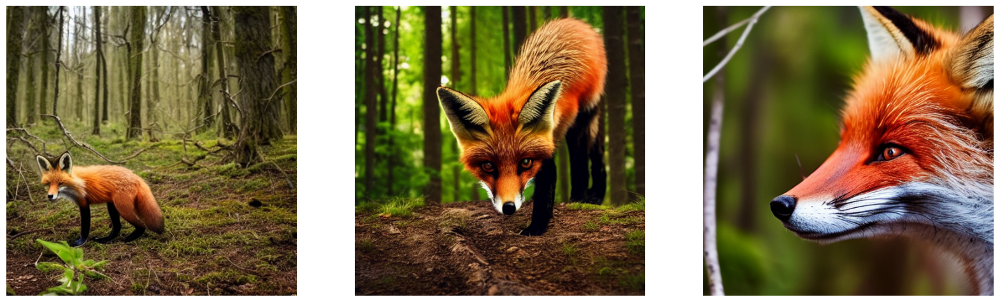

In [12]:
start = time.time()

images = model.text_to_image(
    "Curious fox exploring a forest, side look, realistic photography, "
    "detailed portrait, earthy colors",
    batch_size = 3
)
end = time.time()
plot_images(images)
print(f"Mixed precision model: {(end - start):.2f} seconds")

In [3]:
keras.backend.clear_session()

In [4]:
#Set back to the default for benchmarking purposes.
keras.mixed_precision.set_global_policy("float32")

model = keras_cv.models.StableDiffusion(jit_compile=True)

By using this model checkpoint, you acknowledge that its usage is subject to the terms of the CreativeML Open RAIL-M license at https://raw.githubusercontent.com/CompVis/stable-diffusion/main/LICENSE


In [5]:
#Warmup
images = model.text_to_image("an avocado armchair", batch_size=3)

50/50 [==============================] - 169s 2s/step


NameError: name 'plot_images' is not defined

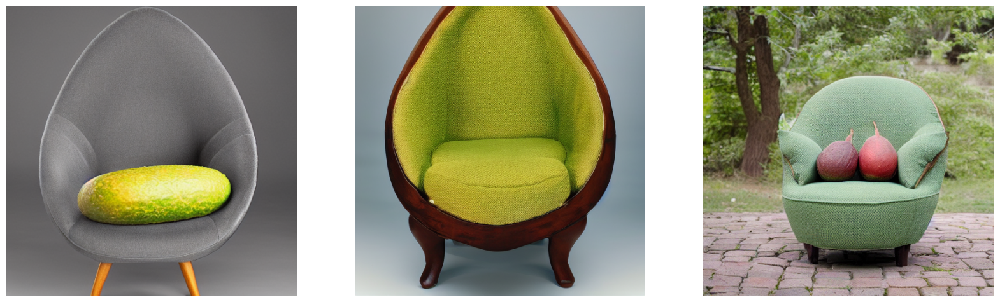

In [7]:
plot_images(images)

50/50 [==============================] - 88s 2s/step
With XLA: 89.02 seconds


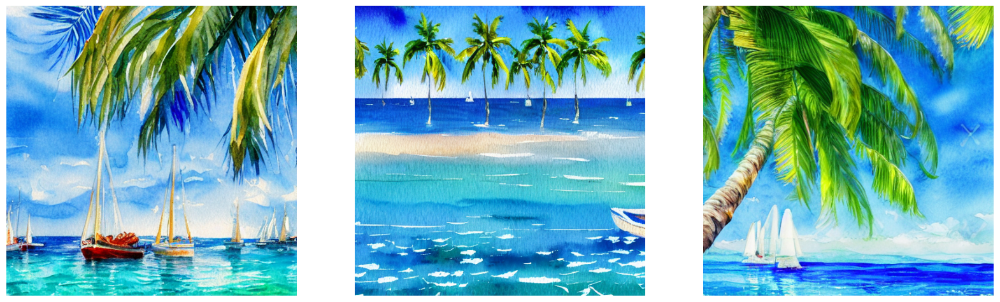

In [8]:
start = time.time()

images = model.text_to_image(
    "Blue Ocean and White Sailboats in a Tropical Paradise, Impressionist, "
    "Vibrant, Detailed, Watercolor-like rendering, Serene, Nautical, "
    "Lush, Exquisite, 4k, 8k",
    batch_size = 3
)
end = time.time()
plot_images(images)
print(f"With XLA: {(end - start):.2f} seconds")
keras.backend.clear_session()

In [10]:
keras.mixed_precision.set_global_policy("mixed_float16")
model = keras_cv.models.StableDiffusion(jit_compile=True)

By using this model checkpoint, you acknowledge that its usage is subject to the terms of the CreativeML Open RAIL-M license at https://raw.githubusercontent.com/CompVis/stable-diffusion/main/LICENSE


50/50 [==============================] - 138s 611ms/step


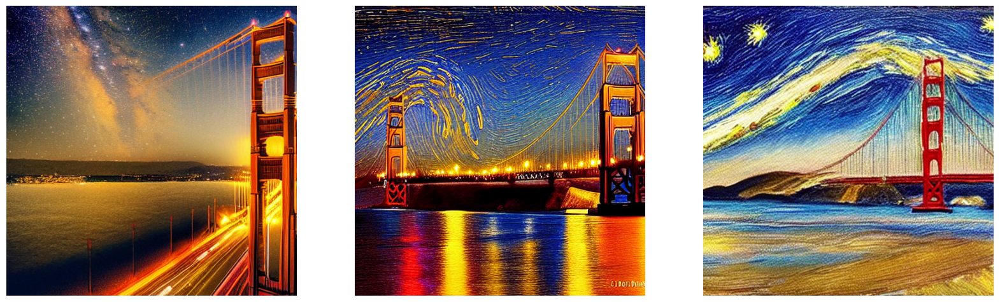

In [11]:
images = model.text_to_image(
    "Golden Gate Bridge in the style of Starry Night",
    batch_size = 3
)
plot_images(images)

50/50 [==============================] - 30s 597ms/step


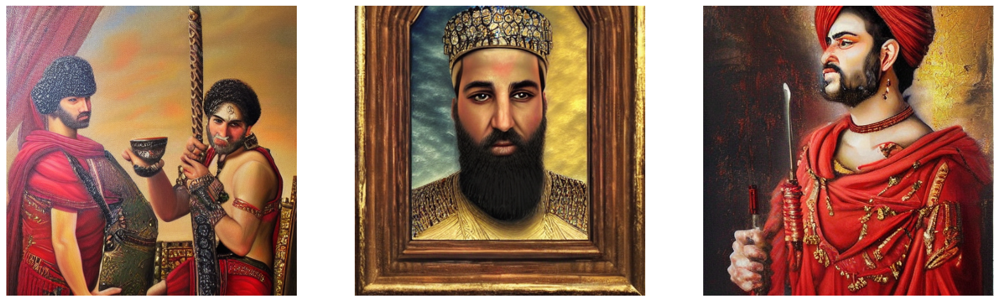

In [12]:
images = model.text_to_image(
    "Perspolis in Iran in the style of Oil Painting and Realistic",
    batch_size = 3
)
plot_images(images)

50/50 [==============================] - 31s 614ms/step
XLA: mixed precision: 31.58 seconds


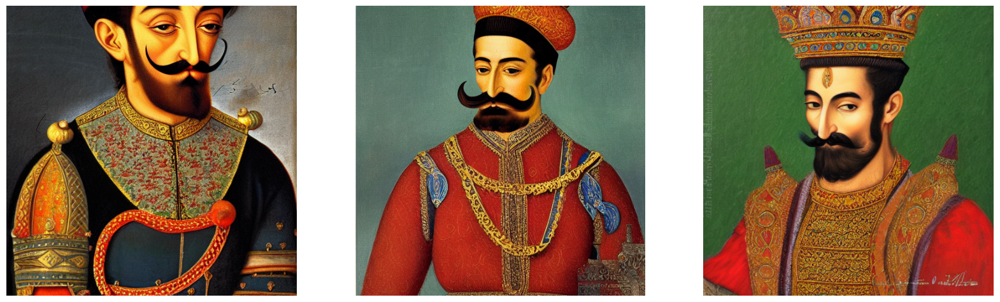

In [88]:
start = time.time()

images = model.text_to_image(
    "Shah Abbas Safavid, the Crown in his head, The Handlebar Moustache and Without Beard, Realistic, "
    "Vibrant, Detailed, Oil Painting, Serene, "
    "Exquisite, 4k, 8k and Without Mistake in Image Generation",
    batch_size = 3
)
end = time.time()
plot_images(images)
print(f"XLA: mixed precision: {(end - start):.2f} seconds")

50/50 [==============================] - 31s 617ms/step


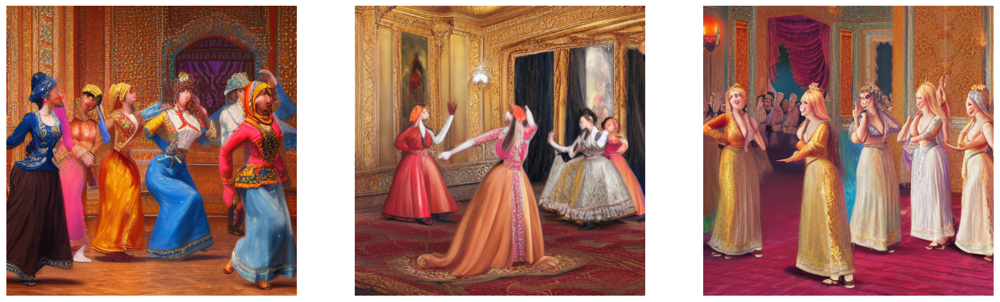

In [39]:
images = model.text_to_image(
    "Beautiful Women Dancing in front of the Sultan Sitting in The Throne, in The Night, in the Harem, "
    "The Handlebar Moustache and No Beard, Realistic, "
    "Vibrant, Detailed, Oil Painting, Serene, "
    "Exquisite, 4k, 8k and Without Mistake in Image Generation",
    batch_size = 3
)
plot_images(images)